In [1]:
import xarray as xr
import numpy as np
from minisom import MiniSom
import pandas as pd
from sklearn.preprocessing import RobustScaler
import pprint
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.gridspec import GridSpec 
import matplotlib.colors as mcolors
from matplotlib import colormaps as cm
import matplotlib.gridspec as gridspec 
import warnings
from herbie import paint
from matplotlib.colors import ListedColormap, BoundaryNorm

# Ignore all warnings
warnings.filterwarnings("ignore")

from som_2var_training import read_and_transform, build_scaler, train_som

/home/z1998298/.local/lib/python3.9/site-packages/gribapi/__init__.py:23: UserWarning: ecCodes 2.39.0 or higher is recommended. You are running version 2.26.0
  warnings.warn(


In [2]:
ds_hail = xr.open_dataset('./Datasets/pper_hail_1979_2023.nc')

In [3]:
prefs = {'filename': "/home/scratch/dwefer/GEFSv12/z500_pwat_anomalies.nc", 
         'var1': 'gh', 'var2': 'pwat', 'wlon': 220, 'elon': 305, 'nlat': 55, 'slat': 20, 
         'som_config': {'x': 5, 'y': 4,'sigma': 0.5, 'random_seed': 42},
         'som_train': {'num_iteration': 10000, 'random_order': True, 'verbose': True}}

trained_som, trained_scaler, train_info, xr_data = train_som(prefs)


current model configuration
{'input_len': 24282, 'random_seed': 42, 'sigma': 0.5, 'x': 5, 'y': 4}
current training configuration
{'data': array([[-0.66050106, -0.68316907, -0.70958024, ..., -0.7250001 ,
        -0.7583334 , -0.7583332 ],
       [-0.71175027, -0.7709796 , -0.83132076, ..., -0.39166674,
        -0.35000005, -0.2916665 ],
       [-0.28915408, -0.28948432, -0.29526958, ..., -0.6833334 ,
        -0.8833334 , -1.0499998 ],
       ...,
       [-0.87913156, -0.8735199 , -0.8690234 , ...,  0.5749998 ,
         0.49166647,  0.375     ],
       [-0.31367952, -0.29052007, -0.26362565, ...,  0.25887743,
         0.21721077,  0.16721089],
       [-0.43595633, -0.43200427, -0.43102336, ..., -0.10833359,
        -0.19166677, -0.24999984]], dtype=float32),
 'num_iteration': 10000,
 'random_order': True,
 'verbose': True}
 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 73.85657159964673


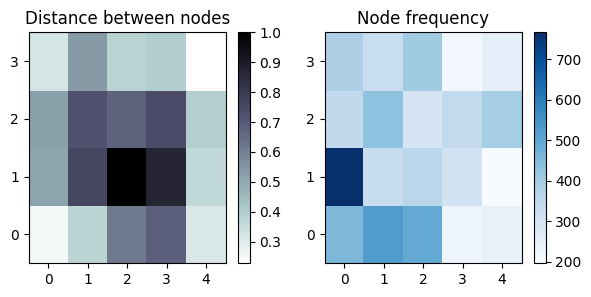

In [4]:
plt.rcParams['figure.figsize'] = 7, 3
x = [x+0.5 for x in range(train_info['som_config']['x'])]
y = [y+0.5 for y in range(train_info['som_config']['y'])]

ax = plt.subplot(1, 2, 1)
ax.set_yticks(y, range(train_info['som_config']['y']))
ax.set_xticks(x, range(train_info['som_config']['x']))
ax.set_title("Distance between nodes")
mmp = ax.pcolor(trained_som.distance_map().T, cmap='bone_r')
plt.colorbar(mmp, ax=ax)

ax = plt.subplot(1, 2, 2)
ax.set_yticks(y, range(train_info['som_config']['y']))
ax.set_xticks(x, range(train_info['som_config']['x']))
ax.set_title("Node frequency")
mmp = ax.pcolor(trained_som.activation_response(train_info['som_train']['data']).T, cmap='Blues')
plt.colorbar(mmp, ax=ax)

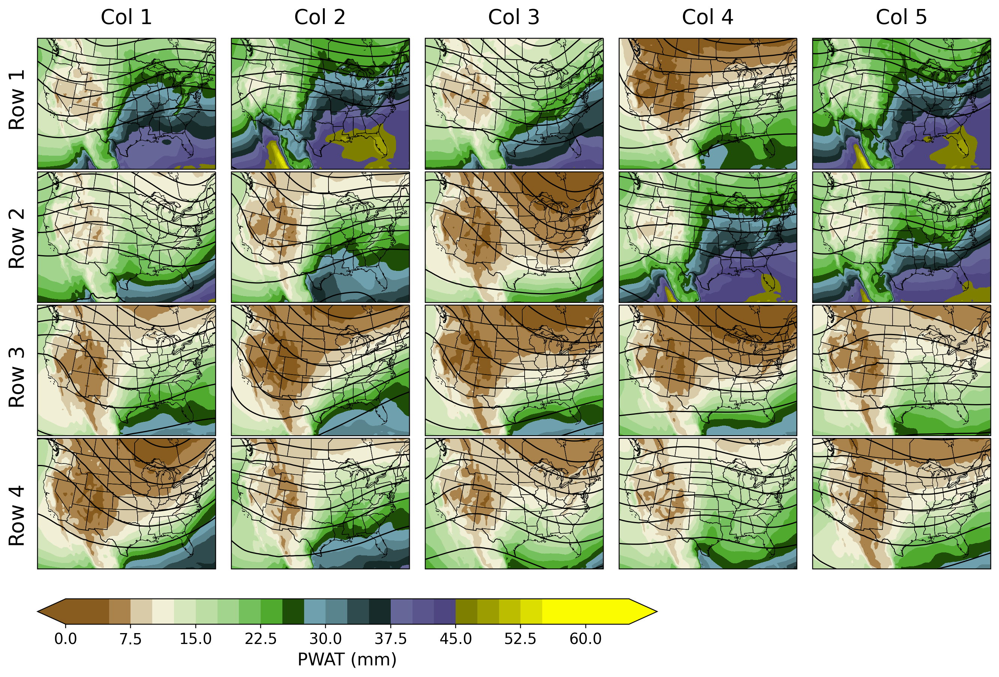

In [5]:
win_map = trained_som.win_map(train_info["som_train"]["data"])
freq = trained_som.activation_response(train_info["som_train"]["data"]).ravel()

nx, ny = prefs["som_config"]["x"], prefs["som_config"]["y"]  # 5, 5
n_nodes = nx * ny  

lat = xr_data['latitude'].values
lon = xr_data['longitude'].values
nlat, nlon = len(lat), len(lon)
ngrid = nlat * nlon


nodes = [(i, j) for i in range(nx) for j in range(ny)]

def inv_mean(node):
    v = np.mean(win_map[node], axis=0)
    return trained_scaler.inverse_transform([v])[0]

means = np.vstack([inv_mean(node) for node in nodes]) 

z500_avg = means[:, :ngrid].reshape(n_nodes, nlat, nlon)
pwat_avg = means[:, ngrid:].reshape(n_nodes, nlat, nlon)

da_z500 = xr.DataArray(
    z500_avg,
    dims=("node", "latitude", "longitude"),
    coords={"node": np.arange(n_nodes), "latitude": lat, "longitude": lon},
    name="gh"
)
da_pwat = xr.DataArray(
    pwat_avg,
    dims=("node", "latitude", "longitude"),
    coords={"node": np.arange(n_nodes), "latitude": lat, "longitude": lon},
    name="pwat"
)


extent = [
    float(xr_data["longitude"].values.min() - 340),
    float(xr_data["longitude"].values.max() - 380),
    float(xr_data["latitude"].values.min() + 3),
    float(xr_data["latitude"].values.max() - 3),
]

proj = ccrs.LambertConformal()
pc = ccrs.PlateCarree()

norm_z500 = mcolors.Normalize(vmin=float(da_z500.min()), vmax=float(da_z500.max()))
norm_pwat = mcolors.Normalize(vmin=float(da_pwat.min()), vmax=float(da_pwat.max()))


colors = ["#885c1e",
          "#a9834b",
          "#c1a779",
          "#d9cba7",
          "#f1f0d6",
          "#d6e6bd",
          "#bcdda4",
          "#a3d48d",
          "#89ca75",
          "#73c05d",
          "#50aa2d",
          "#1d4d06",
          "#6ea0ad",
          "#5a848d",
          "#44686d",
          "#2f4b4d",
          "#182b2b",
          "#666698",
          "#5a568d",
          "#4d4680",
          "#3f3575",
          "#7e7e00",
          "#9c9d00",
          "#bcbd00",
          "#dcdd00",
          "#fbfc00"
           ]
levels = [i * 2.5 for i in range(27)]
cmap = ListedColormap(colors)



def plot_node_block(node_indices, nrows, ncols, dpi=220):
    fig_w = 2.6 * ncols
    fig_h = 2.2 * nrows

    fig, axs = plt.subplots(
        nrows, ncols,
        figsize=(fig_w, fig_h),
        dpi=dpi,
        subplot_kw={"projection": proj},
        constrained_layout=False
    )

    if nrows == 1 and ncols == 1:
        axs = np.array([[axs]])
    elif nrows == 1:
        axs = np.expand_dims(axs, axis=0)
    elif ncols == 1:
        axs = np.expand_dims(axs, axis=1)

    mappable_p = None

    for k in range(nrows * ncols):
        r = k // ncols
        c = k % ncols
        ax = axs[r, c]

        if k >= len(node_indices):
            ax.set_visible(False)
            continue

        node_idx = node_indices[k]

        ax.set_extent(extent, crs=pc)
        ax.add_feature(cfeature.BORDERS, linewidth=0.6)
        ax.add_feature(cfeature.STATES, linewidth=0.4)

        mappable_p = da_pwat.isel(node=node_idx).plot.contourf(
            ax=ax,
            transform=pc,
            levels=levels,
            cmap=cmap,
            add_colorbar=False,
            norm=norm_pwat,
            extend="both"
        )

        da_z500.isel(node=node_idx).plot.contour(
            ax=ax,
            transform=pc,
            colors="k",
            levels=10,
            linewidths=1,
            add_colorbar=False
        )

        ax.set_title("")
        ax.set_xlabel("")
        ax.set_ylabel("")

    # ---- tighter layout: reduce title gap ----
    fig.subplots_adjust(left=0.08, right=0.98, top=0.94, bottom=0.18, wspace=0.02, hspace=0.02)


    # Force final positions to exist before placing fig.text labels
    fig.canvas.draw()

    # ---- label columns once (top) and rows once (left) OUTSIDE the axes ----
    y_pad = 0.004
    x_pad = 0.005

    for c in range(ncols):
        ax = axs[0, c]
        if ax.get_visible():
            bb = ax.get_position()
            fig.text((bb.x0 + bb.x1) / 2, bb.y1 + y_pad, f"Col {c+1}",
                     ha="center", va="bottom", fontsize=18)

    for r in range(nrows):
        ax = axs[r, 0]
        if ax.get_visible():
            bb = ax.get_position()
            fig.text(bb.x0 - x_pad, (bb.y0 + bb.y1) / 2, f"Row {r+1}",
                     ha="right", va="center", fontsize=18, rotation=90)

     # ---- final layout (set ONCE; reserve bottom space for colorbar) ----
    fig.subplots_adjust(left=0.08, right=0.98, top=0.93, bottom=0.20,
                        wspace=0.02, hspace=0.02)
    fig.canvas.draw()

    # ---- left-aligned colorbar that CANNOT overlap the plots ----
    visible = [ax for ax in axs.ravel() if ax.get_visible()]
    left  = min(ax.get_position().x0 for ax in visible)
    right = max(ax.get_position().x1 for ax in visible)

    bottom = fig.subplotpars.bottom  # reserved margin height
    cb_width  = (right - left) * 0.65
    cb_height = 0.035                # thicker
    cb_y = (bottom - cb_height) * 0.75  # put it inside the reserved margin (not touching plots)

    cax = fig.add_axes([left, cb_y, cb_width, cb_height])

    cb = fig.colorbar(mappable_p, cax=cax, orientation="horizontal", extend="both")
    cb.set_label("PWAT (mm)", fontsize=15)
    cb.ax.tick_params(labelsize=13)

    plt.show()

    # NOTE: bbox_inches="tight" can clip / shift manual add_axes colorbars
    fig.savefig("./Figures/nodes.png", dpi=dpi, bbox_inches=None)


plot_node_block(
    list(range(0, 20)),
    nrows=4,
    ncols=5,
)

In [6]:
win_map_idx = trained_som.win_map(train_info['som_train']['data'], return_indices = True)

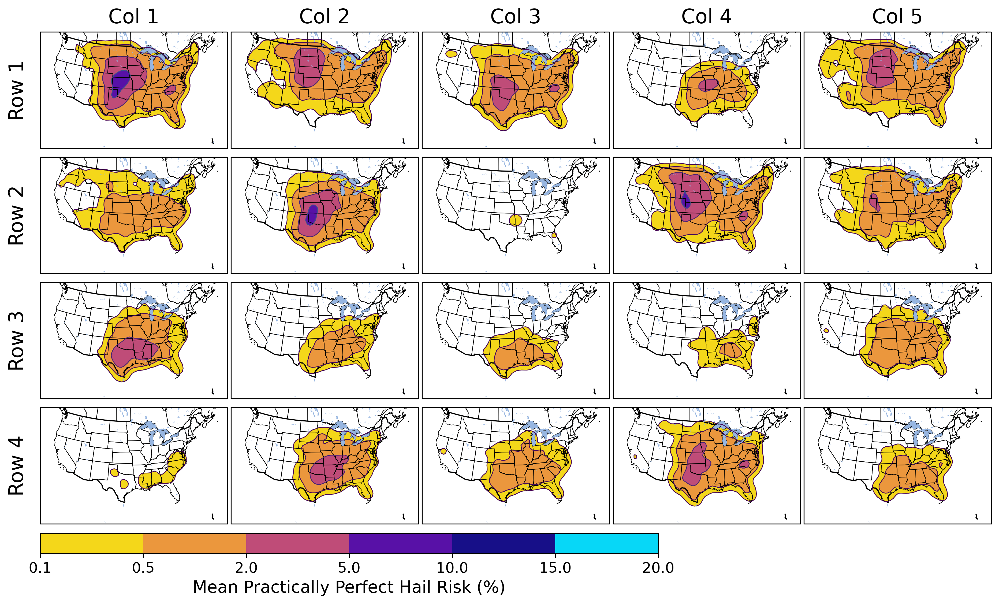

In [7]:
colors = [
    "#f4d71a",
    "#eb973d",
    "#bf4c78",
    "#5811a7",
    "#170f88",
    "#07d7f7"
]
levels = [0.1, 0.5, 2.0, 5.0, 10.0, 15, 20]

nodes = list(sorted(win_map_idx.keys()))
n_nodes = len(nodes)

ncols = 5
nrows = int(np.ceil(n_nodes / ncols))

dpi = 300

plt.rcParams["figure.figsize"] = (2.6 * ncols, 1.8 * nrows)
fig, axes = plt.subplots(
    nrows=nrows,
    ncols=ncols,
    dpi=dpi,
    subplot_kw={"projection": ccrs.LambertConformal()},
    constrained_layout=False
)

axes = np.atleast_2d(axes)

cm_hail = None  # keep one mappable for the shared colorbar

for k, node in enumerate(nodes):
    row = k // ncols
    col = k % ncols
    ax = axes[row, col]

    idx_list = win_map_idx[node]
    nodesel = xr_data.isel(time=idx_list)

    # shift back a day bc pper is 12z–12z, and dataset is 0z
    time_sel = (nodesel.time - np.timedelta64(1, "D")).astype("datetime64[D]").astype(str)

    ds_hail_sel = ds_hail.sel(time=time_sel, method="nearest")
    hail_mean = ds_hail_sel.p_perfect_hail.mean(dim="time")  # (y, x)

    ax.add_feature(cfeature.BORDERS)
    ax.add_feature(cfeature.STATES, linewidth=0.5)
    ax.add_feature(cfeature.LAKES)
    ax.set_extent([-122, -67, 20, 50], crs=ccrs.PlateCarree())

    # remove per-panel title + labels
    ax.set_title("")
    ax.set_xlabel("")
    ax.set_ylabel("")

    cm_hail = ax.contourf(
        ds_hail.lon,
        ds_hail.lat,
        hail_mean,
        colors=colors,
        levels=levels,
        transform=ccrs.PlateCarree(),
    )
    
    ax.contour(
        ds_hail.lon,
        ds_hail.lat,
        hail_mean,
        levels=levels,
        transform=ccrs.PlateCarree(),
        linewidths=0.7,
    )

# hide unused panels
for k in range(n_nodes, nrows * ncols):
    axes.flat[k].set_visible(False)

# ---- tighten overall padding (do this BEFORE placing row/col labels) ----
fig.subplots_adjust(left=0.07, right=0.98, top=0.97, bottom=0.11, wspace=0.02, hspace=0.02)

# Force final positions to be known, so labels land OUTSIDE axes
fig.canvas.draw()

# ---- label columns once (top) and rows once (left) ----
y_pad = 0.008
x_pad = 0.012

for c in range(ncols):
    ax = axes[0, c]
    if ax.get_visible():
        bb = ax.get_position()
        fig.text((bb.x0 + bb.x1) / 2, bb.y1 + y_pad, f"Col {c+1}",
                 ha="center", va="bottom", fontsize=18)

for r in range(nrows):
    ax = axes[r, 0]
    if ax.get_visible():
        bb = ax.get_position()
        fig.text(bb.x0 - x_pad, (bb.y0 + bb.y1) / 2, f"Row {r+1}",
                 ha="right", va="center", fontsize=18, rotation=90)

# ---- single left-aligned, compact colorbar ----
# [left, bottom, width, height] in figure coordinates
visible = [ax for ax in axes.ravel() if ax.get_visible()]
left  = min(ax.get_position().x0 for ax in visible)
right = max(ax.get_position().x1 for ax in visible)

bottom = fig.subplotpars.bottom
cb_width  = (right - left) * 0.65
cb_height = 0.035
cb_y = (bottom - cb_height) * 0.85  # raise/lower quickly (0.65–0.85 is typical)

cax = fig.add_axes([left, cb_y, cb_width, cb_height])
cb = fig.colorbar(cm_hail, cax=cax, orientation="horizontal")
cb.set_label("Mean Practically Perfect Hail Risk (%)", fontsize=15)
cb.ax.tick_params(labelsize=13)

plt.show()

#fig.savefig("./Figures/mean_hail.png", dpi=dpi, bbox_inches="tight")

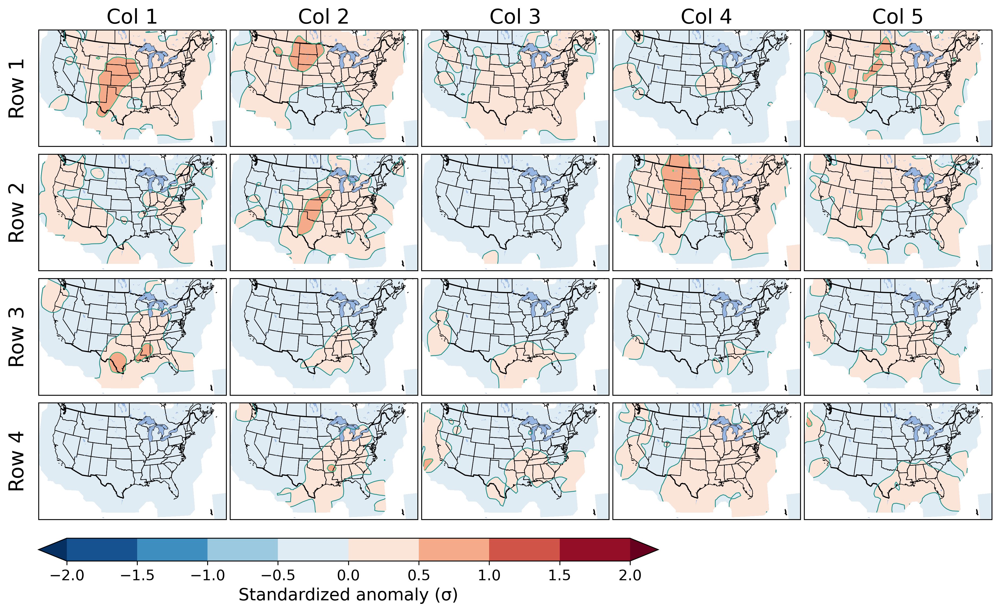

In [8]:
def standardized_anomaly(node_mean, clim_mean, clim_std, eps=1e-12):
    return (node_mean - clim_mean) / (clim_std.where(clim_std > eps))


anom_levels = np.arange(-2, 2.5, 0.5)

nodes = list(sorted(win_map_idx.keys()))
n_nodes = len(nodes)

ncols = 5
nrows = int(np.ceil(n_nodes / ncols))
dpi = 300

clim_mean = ds_hail["p_perfect_hail"].mean(dim="time")
clim_std  = ds_hail["p_perfect_hail"].std(dim="time")

plt.rcParams["figure.figsize"] = (2.6 * ncols, 2 * nrows)
fig, axes = plt.subplots(
    nrows=nrows,
    ncols=ncols,
    dpi=dpi,
    subplot_kw={"projection": ccrs.LambertConformal()},
    constrained_layout=False
)
axes = np.atleast_2d(axes)

mappable = None

for k, node in enumerate(nodes):
    row = k // ncols
    col = k % ncols
    ax = axes[row, col]

    idx_list = win_map_idx[node]
    nodesel = xr_data.isel(time=idx_list)

    # shift back a day bc pper is 12z–12z, and dataset is 0z
    time_sel = (nodesel.time - np.timedelta64(1, "D")).astype("datetime64[D]").astype(str)

    ds_hail_sel = ds_hail.sel(time=time_sel, method="nearest")
    hail_node_mean = ds_hail_sel["p_perfect_hail"].mean(dim="time")

    hail_anom = standardized_anomaly(hail_node_mean, clim_mean, clim_std)

    ax.add_feature(cfeature.BORDERS)
    ax.add_feature(cfeature.STATES, linewidth=0.5)
    ax.add_feature(cfeature.LAKES)
    ax.set_extent([-122, -67, 20, 50], crs=ccrs.PlateCarree())

    # no per-panel text
    ax.set_title("")
    ax.set_xlabel("")
    ax.set_ylabel("")

    mappable = ax.contourf(
        ds_hail.lon,
        ds_hail.lat,
        hail_anom,
        levels=anom_levels,
        cmap="RdBu_r",
        extend="both",
        transform=ccrs.PlateCarree(),
    )
    
    ax.contour(
        ds_hail.lon,
        ds_hail.lat,
        hail_anom,
        levels=anom_levels,
        linewidths=0.7,
        extend="both",
        transform=ccrs.PlateCarree(),
    )

# hide unused panels
for k in range(n_nodes, nrows * ncols):
    axes.flat[k].set_visible(False)

# ---- reserve bottom margin for ONE colorbar + tighten layout ----
fig.subplots_adjust(left=0.08, right=0.98, top=0.96, bottom=0.20, wspace=0.02, hspace=0.02)
fig.canvas.draw()

# ---- label columns once + rows once (outside axes) ----
y_pad = 0.003   # closer to plots
x_pad = 0.010

for c in range(ncols):
    ax = axes[0, c]
    if ax.get_visible():
        bb = ax.get_position()
        fig.text((bb.x0 + bb.x1) / 2, bb.y1 + y_pad, f"Col {c+1}",
                 ha="center", va="bottom", fontsize=18)

for r in range(nrows):
    ax = axes[r, 0]
    if ax.get_visible():
        bb = ax.get_position()
        fig.text(bb.x0 - x_pad, (bb.y0 + bb.y1) / 2, f"Row {r+1}",
                 ha="right", va="center", fontsize=18, rotation=90)

# ---- shared colorbar (left-aligned with subplot grid; no overlap) ----
visible = [ax for ax in axes.ravel() if ax.get_visible()]
left  = min(ax.get_position().x0 for ax in visible)
right = max(ax.get_position().x1 for ax in visible)

bottom = fig.subplotpars.bottom
cb_width  = (right - left) * 0.65
cb_height = 0.035
cb_y = (bottom - cb_height) * 0.85  # raise/lower quickly (0.65–0.85 is typical)

cax = fig.add_axes([left, cb_y, cb_width, cb_height])
cb = fig.colorbar(mappable, cax=cax, orientation="horizontal", extend="both")
cb.set_label("Standardized anomaly (σ)", fontsize=15)
cb.ax.tick_params(labelsize=13)

plt.show()

# bbox_inches="tight" can clip/shuffle manual add_axes; avoid it here
#fig.savefig("./Figures/stdanom_hail.png", dpi=dpi, bbox_inches=None)

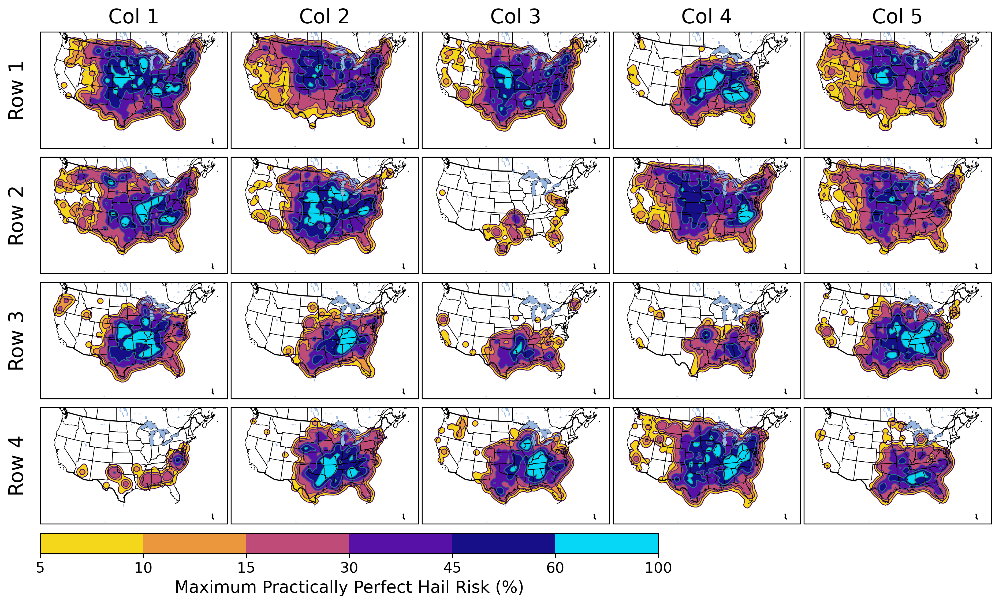

In [9]:
colors = [
    "#f4d71a",
    "#eb973d",
    "#bf4c78",
    "#5811a7",
    "#170f88",
    "#07d7f7"
]
levels = [5, 10, 15, 30, 45, 60, 100]

nodes = list(sorted(win_map_idx.keys()))
n_nodes = len(nodes)

ncols = 5
nrows = int(np.ceil(n_nodes / ncols))

dpi = 300

plt.rcParams["figure.figsize"] = (2.6 * ncols, 1.8 * nrows)
fig, axes = plt.subplots(
    nrows=nrows,
    ncols=ncols,
    dpi=dpi,
    subplot_kw={"projection": ccrs.LambertConformal()},
    constrained_layout=False
)

axes = np.atleast_2d(axes)

cm_hail = None  # keep one mappable for the shared colorbar

for k, node in enumerate(nodes):
    row = k // ncols
    col = k % ncols
    ax = axes[row, col]

    idx_list = win_map_idx[node]
    nodesel = xr_data.isel(time=idx_list)

    # shift back a day bc pper is 12z–12z, and dataset is 0z
    time_sel = (nodesel.time - np.timedelta64(1, "D")).astype("datetime64[D]").astype(str)

    ds_hail_sel = ds_hail.sel(time=time_sel, method="nearest")
    hail_mean = ds_hail_sel.p_perfect_hail.max(dim="time")  # (y, x)

    ax.add_feature(cfeature.BORDERS)
    ax.add_feature(cfeature.STATES, linewidth=0.5)
    ax.add_feature(cfeature.LAKES)
    ax.set_extent([-122, -67, 20, 50], crs=ccrs.PlateCarree())

    # remove per-panel title + labels
    ax.set_title("")
    ax.set_xlabel("")
    ax.set_ylabel("")

    cm_hail = ax.contourf(
        ds_hail.lon,
        ds_hail.lat,
        hail_mean,
        colors=colors,
        levels=levels,
        transform=ccrs.PlateCarree(),
    )
    
    ax.contour(
        ds_hail.lon,
        ds_hail.lat,
        hail_mean,
        levels=levels,
        linewidths=0.7,
        transform=ccrs.PlateCarree(),
    )

# hide unused panels
for k in range(n_nodes, nrows * ncols):
    axes.flat[k].set_visible(False)

# ---- tighten overall padding (do this BEFORE placing row/col labels) ----
fig.subplots_adjust(left=0.07, right=0.98, top=0.97, bottom=0.11, wspace=0.02, hspace=0.02)

# Force final positions to be known, so labels land OUTSIDE axes
fig.canvas.draw()

# ---- label columns once (top) and rows once (left) ----
y_pad = 0.008
x_pad = 0.012

for c in range(ncols):
    ax = axes[0, c]
    if ax.get_visible():
        bb = ax.get_position()
        fig.text((bb.x0 + bb.x1) / 2, bb.y1 + y_pad, f"Col {c+1}",
                 ha="center", va="bottom", fontsize=18)

for r in range(nrows):
    ax = axes[r, 0]
    if ax.get_visible():
        bb = ax.get_position()
        fig.text(bb.x0 - x_pad, (bb.y0 + bb.y1) / 2, f"Row {r+1}",
                 ha="right", va="center", fontsize=18, rotation=90)

# ---- single left-aligned, compact colorbar ----
# [left, bottom, width, height] in figure coordinates
visible = [ax for ax in axes.ravel() if ax.get_visible()]
left  = min(ax.get_position().x0 for ax in visible)
right = max(ax.get_position().x1 for ax in visible)

bottom = fig.subplotpars.bottom
cb_width  = (right - left) * 0.65
cb_height = 0.035
cb_y = (bottom - cb_height) * 0.85  # raise/lower quickly (0.65–0.85 is typical)

cax = fig.add_axes([left, cb_y, cb_width, cb_height])
cb = fig.colorbar(cm_hail, cax=cax, orientation="horizontal")
cb.set_label("Maximum Practically Perfect Hail Risk (%)", fontsize=15)
cb.ax.tick_params(labelsize=13)

plt.show()

#fig.savefig("./Figures/max_hail.png", dpi=dpi, bbox_inches="tight")

In [ ]:
colors = [
    "#f4d71a",
    "#eb973d",
    "#bf4c78",
    "#5811a7",
    "#170f88",
    "#07d7f7"
]
levels = [0.1, 0.5, 2.0, 5.0, 10.0, 15, 20]

nodes = list(sorted(win_map_idx.keys()))
n_nodes = len(nodes)

ncols = 5
nrows = int(np.ceil(n_nodes / ncols))

dpi = 300

plt.rcParams["figure.figsize"] = (2.6 * ncols, 1.8 * nrows)
fig, axes = plt.subplots(
    nrows=nrows,
    ncols=ncols,
    dpi=dpi,
    subplot_kw={"projection": ccrs.LambertConformal()},
    constrained_layout=False
)

axes = np.atleast_2d(axes)

cm_hail = None  # keep one mappable for the shared colorbar

for k, node in enumerate(nodes):
    row = k // ncols
    col = k % ncols
    ax = axes[row, col]

    idx_list = win_map_idx[node]
    nodesel = xr_data.isel(time=idx_list)

    # shift back a day bc pper is 12z–12z, and dataset is 0z
    time_sel = (nodesel.time - np.timedelta64(1, "D")).astype("datetime64[D]").astype(str)

    ds_hail_sel = ds_hail.sel(time=time_sel, method="nearest")
    hail_mean = ds_hail_sel.p_perfect_hail.quantile(0.25, dim="time")
    ax.add_feature(cfeature.BORDERS)
    ax.add_feature(cfeature.STATES, linewidth=0.5)
    ax.add_feature(cfeature.LAKES)
    ax.set_extent([-122, -67, 20, 50], crs=ccrs.PlateCarree())

    # remove per-panel title + labels
    ax.set_title("")
    ax.set_xlabel("")
    ax.set_ylabel("")

    cm_hail = ax.contourf(
        ds_hail.lon,
        ds_hail.lat,
        hail_mean,
        colors=colors,
        levels=levels,
        transform=ccrs.PlateCarree(),
    )
    
    ax.contour(
        ds_hail.lon,
        ds_hail.lat,
        hail_mean,
        levels=levels,
        transform=ccrs.PlateCarree(),
        linewidths=0.7,
    )

# hide unused panels
for k in range(n_nodes, nrows * ncols):
    axes.flat[k].set_visible(False)

# ---- tighten overall padding (do this BEFORE placing row/col labels) ----
fig.subplots_adjust(left=0.07, right=0.98, top=0.97, bottom=0.11, wspace=0.02, hspace=0.02)

# Force final positions to be known, so labels land OUTSIDE axes
fig.canvas.draw()

# ---- label columns once (top) and rows once (left) ----
y_pad = 0.008
x_pad = 0.012

for c in range(ncols):
    ax = axes[0, c]
    if ax.get_visible():
        bb = ax.get_position()
        fig.text((bb.x0 + bb.x1) / 2, bb.y1 + y_pad, f"Col {c+1}",
                 ha="center", va="bottom", fontsize=18)

for r in range(nrows):
    ax = axes[r, 0]
    if ax.get_visible():
        bb = ax.get_position()
        fig.text(bb.x0 - x_pad, (bb.y0 + bb.y1) / 2, f"Row {r+1}",
                 ha="right", va="center", fontsize=18, rotation=90)

# ---- single left-aligned, compact colorbar ----
# [left, bottom, width, height] in figure coordinates
visible = [ax for ax in axes.ravel() if ax.get_visible()]
left  = min(ax.get_position().x0 for ax in visible)
right = max(ax.get_position().x1 for ax in visible)

bottom = fig.subplotpars.bottom
cb_width  = (right - left) * 0.65
cb_height = 0.035
cb_y = (bottom - cb_height) * 0.85  # raise/lower quickly (0.65–0.85 is typical)

cax = fig.add_axes([left, cb_y, cb_width, cb_height])
cb = fig.colorbar(cm_hail, cax=cax, orientation="horizontal")
cb.set_label("25th Percentile Practically Perfect Hail Risk (%)", fontsize=15)
cb.ax.tick_params(labelsize=13)

plt.show()

#fig.savefig("./Figures/25th_percentile_hail.png", dpi=dpi, bbox_inches="tight")



In [ ]:
colors = [
    "#f4d71a",
    "#eb973d",
    "#bf4c78",
    "#5811a7",
    "#170f88",
    "#07d7f7"
]
levels = [0.1, 0.5, 2.0, 5.0, 10.0, 15, 20]

nodes = list(sorted(win_map_idx.keys()))
n_nodes = len(nodes)

ncols = 5
nrows = int(np.ceil(n_nodes / ncols))

dpi = 300

plt.rcParams["figure.figsize"] = (2.6 * ncols, 1.8 * nrows)
fig, axes = plt.subplots(
    nrows=nrows,
    ncols=ncols,
    dpi=dpi,
    subplot_kw={"projection": ccrs.LambertConformal()},
    constrained_layout=False
)

axes = np.atleast_2d(axes)

cm_hail = None  # keep one mappable for the shared colorbar

for k, node in enumerate(nodes):
    row = k // ncols
    col = k % ncols
    ax = axes[row, col]

    idx_list = win_map_idx[node]
    nodesel = xr_data.isel(time=idx_list)

    # shift back a day bc pper is 12z–12z, and dataset is 0z
    time_sel = (nodesel.time - np.timedelta64(1, "D")).astype("datetime64[D]").astype(str)

    ds_hail_sel = ds_hail.sel(time=time_sel, method="nearest")
    hail_mean = ds_hail_sel.p_perfect_hail.quantile(0.75, dim="time")
    ax.add_feature(cfeature.BORDERS)
    ax.add_feature(cfeature.STATES, linewidth=0.5)
    ax.add_feature(cfeature.LAKES)
    ax.set_extent([-122, -67, 20, 50], crs=ccrs.PlateCarree())

    # remove per-panel title + labels
    ax.set_title("")
    ax.set_xlabel("")
    ax.set_ylabel("")

    cm_hail = ax.contourf(
        ds_hail.lon,
        ds_hail.lat,
        hail_mean,
        colors=colors,
        levels=levels,
        transform=ccrs.PlateCarree(),
        extend="max",
    )
    
    ax.contour(
        ds_hail.lon,
        ds_hail.lat,
        hail_mean,
        levels=levels,
        transform=ccrs.PlateCarree(),
        linewidths=0.7,
    )

# hide unused panels
for k in range(n_nodes, nrows * ncols):
    axes.flat[k].set_visible(False)

# ---- tighten overall padding (do this BEFORE placing row/col labels) ----
fig.subplots_adjust(left=0.07, right=0.98, top=0.97, bottom=0.11, wspace=0.02, hspace=0.02)

# Force final positions to be known, so labels land OUTSIDE axes
fig.canvas.draw()

# ---- label columns once (top) and rows once (left) ----
y_pad = 0.008
x_pad = 0.012

for c in range(ncols):
    ax = axes[0, c]
    if ax.get_visible():
        bb = ax.get_position()
        fig.text((bb.x0 + bb.x1) / 2, bb.y1 + y_pad, f"Col {c+1}",
                 ha="center", va="bottom", fontsize=18)

for r in range(nrows):
    ax = axes[r, 0]
    if ax.get_visible():
        bb = ax.get_position()
        fig.text(bb.x0 - x_pad, (bb.y0 + bb.y1) / 2, f"Row {r+1}",
                 ha="right", va="center", fontsize=18, rotation=90)

# ---- single left-aligned, compact colorbar ----
# [left, bottom, width, height] in figure coordinates
visible = [ax for ax in axes.ravel() if ax.get_visible()]
left  = min(ax.get_position().x0 for ax in visible)
right = max(ax.get_position().x1 for ax in visible)

bottom = fig.subplotpars.bottom
cb_width  = (right - left) * 0.65
cb_height = 0.035
cb_y = (bottom - cb_height) * 0.85  # raise/lower quickly (0.65–0.85 is typical)

cax = fig.add_axes([left, cb_y, cb_width, cb_height])
cb = fig.colorbar(cm_hail, cax=cax, orientation="horizontal")
cb.set_label("75th Percentile Practically Perfect Hail Risk (%)", fontsize=15)
cb.ax.tick_params(labelsize=13)

plt.show()

#fig.savefig("./Figures/75th_percentile_hail.png", dpi=dpi, bbox_inches="tight")

In [ ]:
colors = [
    "#f4d71a",
    "#fcd025",
    "#eb973d",
    "#bf4c78",
    "#5811a7",
    "#170f88",
    "#07d7f7"
]
levels = [0.1, 0.5, 2.0, 5.0, 10.0, 15, 25, 50]

nodes = list(sorted(win_map_idx.keys()))
n_nodes = len(nodes)

ncols = 5
nrows = int(np.ceil(n_nodes / ncols))

dpi = 300

plt.rcParams["figure.figsize"] = (2.6 * ncols, 1.8 * nrows)
fig, axes = plt.subplots(
    nrows=nrows,
    ncols=ncols,
    dpi=dpi,
    subplot_kw={"projection": ccrs.LambertConformal()},
    constrained_layout=False
)

axes = np.atleast_2d(axes)

cm_hail = None  # keep one mappable for the shared colorbar

for k, node in enumerate(nodes):
    row = k // ncols
    col = k % ncols
    ax = axes[row, col]

    idx_list = win_map_idx[node]
    nodesel = xr_data.isel(time=idx_list)

    # shift back a day bc pper is 12z–12z, and dataset is 0z
    time_sel = (nodesel.time - np.timedelta64(1, "D")).astype("datetime64[D]").astype(str)

    ds_hail_sel = ds_hail.sel(time=time_sel, method="nearest")
    hail_mean = ds_hail_sel.p_perfect_hail.quantile(0.95, dim="time")
    ax.add_feature(cfeature.BORDERS)
    ax.add_feature(cfeature.STATES, linewidth=0.5)
    ax.add_feature(cfeature.LAKES)
    ax.set_extent([-122, -67, 20, 50], crs=ccrs.PlateCarree())

    # remove per-panel title + labels
    ax.set_title("")
    ax.set_xlabel("")
    ax.set_ylabel("")

    cm_hail = ax.contourf(
        ds_hail.lon,
        ds_hail.lat,
        hail_mean,
        colors=colors,
        levels=levels,
        transform=ccrs.PlateCarree(),
    )
    
    ax.contour(
        ds_hail.lon,
        ds_hail.lat,
        hail_mean,
        levels=levels,
        transform=ccrs.PlateCarree(),
        linewidths=0.7,
    )

# hide unused panels
for k in range(n_nodes, nrows * ncols):
    axes.flat[k].set_visible(False)

# ---- tighten overall padding (do this BEFORE placing row/col labels) ----
fig.subplots_adjust(left=0.07, right=0.98, top=0.97, bottom=0.11, wspace=0.02, hspace=0.02)

# Force final positions to be known, so labels land OUTSIDE axes
fig.canvas.draw()

# ---- label columns once (top) and rows once (left) ----
y_pad = 0.008
x_pad = 0.012

for c in range(ncols):
    ax = axes[0, c]
    if ax.get_visible():
        bb = ax.get_position()
        fig.text((bb.x0 + bb.x1) / 2, bb.y1 + y_pad, f"Col {c+1}",
                 ha="center", va="bottom", fontsize=18)

for r in range(nrows):
    ax = axes[r, 0]
    if ax.get_visible():
        bb = ax.get_position()
        fig.text(bb.x0 - x_pad, (bb.y0 + bb.y1) / 2, f"Row {r+1}",
                 ha="right", va="center", fontsize=18, rotation=90)

# ---- single left-aligned, compact colorbar ----
# [left, bottom, width, height] in figure coordinates
visible = [ax for ax in axes.ravel() if ax.get_visible()]
left  = min(ax.get_position().x0 for ax in visible)
right = max(ax.get_position().x1 for ax in visible)

bottom = fig.subplotpars.bottom
cb_width  = (right - left) * 0.65
cb_height = 0.035
cb_y = (bottom - cb_height) * 0.85  # raise/lower quickly (0.65–0.85 is typical)

cax = fig.add_axes([left, cb_y, cb_width, cb_height])
cb = fig.colorbar(cm_hail, cax=cax, orientation="horizontal")
cb.set_label("95th Percentile Practically Perfect Hail Risk (%)", fontsize=15)
cb.ax.tick_params(labelsize=13)

plt.show()

#fig.savefig("./Figures/95th_percentile_hail.png", dpi=dpi, bbox_inches="tight")

In [ ]:
# keeping around for possible presentation plot
#
#
#
#extent = [
#    float(xr_data.longitude.values.min() - 340),
#    float(xr_data.longitude.values.max() - 380),
#    float(xr_data.latitude.values.min() + 3),
#    float(xr_data.latitude.values.max() - 3),
#]
#
#fig2 = plt.figure(figsize=(6, 5), dpi=150)
#ax = fig2.add_subplot(1, 1, 1, projection=ccrs.LambertConformal())
#ax.set_title("Node (0, 0) Mean PWAT", fontsize=12)
#ax.set_extent(extent, crs=ccrs.PlateCarree())
#
#node_idx = 3
#
#pcm = da_pwat.isel(node=node_idx).plot.pcolormesh(
#    ax=ax,
#    x="longitude", y="latitude",
#    cmap="gist_earth_r",
#    shading="auto",
#    transform=ccrs.PlateCarree(),
#    add_colorbar=False
#)
#
#pct = da_pwat.isel(node=node_idx).plot.contour(
#    ax=ax,
#    x="longitude", y="latitude",
#    colors="k",
#    linewidths=0.6,
#    transform=ccrs.PlateCarree(),
#    add_colorbar=False
#)
#
#ax.clabel(pct, fmt="%.1f", inline=True, fontsize=7)
#ax.add_feature(cfeature.BORDERS, linewidth=0.6)
#ax.add_feature(cfeature.STATES, linewidth=0.4)
#ax.coastlines()
#
#cb = plt.colorbar(pcm, orientation="horizontal", pad=0.05, aspect=40, extend="both")
#cb.set_label("PWAT (kg m$^{-2}$)")
#
#plt.tight_layout()
#plt.show()
#

In [ ]:
# keeping around for possible presentation plot

#extent = [
#    float(xr_data.longitude.values.min() - 340),
#    float(xr_data.longitude.values.max() - 380),
#    float(xr_data.latitude.values.min() + 3),
#    float(xr_data.latitude.values.max() - 3),
#]
#
#node_idx = 3
#
#
#fig1 = plt.figure(figsize=(6, 4), dpi=150)
#ax_z500 = fig1.add_subplot(1, 1, 1, projection=ccrs.LambertConformal())
#ax_z500.set_title("Node 0 Upper Level Flow", fontsize=12)
#ax_z500.set_extent(extent, crs=ccrs.PlateCarree())
#
#
#zcm = da_z500.isel(node=node_idx).plot.pcolormesh(
#    ax=ax_z500,
#    x="longitude", y="latitude",
#    cmap="coolwarm",
#    shading="auto",
#    transform=ccrs.PlateCarree(),
#    add_colorbar=False
#)
#
#zct = da_z500.isel(node=node_idx).plot.contour(
#    ax=ax_z500,
#    x="longitude", y="latitude",
#    colors="k",
#    linewidths=0.7,
#    levels=np.arange(4500, 6300, 45),
#    transform=ccrs.PlateCarree(),
#    add_colorbar=False
#)
#
#ax_z500.clabel(zct, fmt="%.0f", inline=True, fontsize=7)
#ax_z500.add_feature(cfeature.BORDERS, linewidth=0.6)
#ax_z500.add_feature(cfeature.STATES, linewidth=0.4)
#ax_z500.coastlines()
#
#cb = plt.colorbar(zcm, orientation="horizontal", pad=0.05, aspect=40, extend="both")
#cb.set_label("500 hPa height (m)")
#
#plt.tight_layout()
##plt.savefig("./Figures/node00z500.png", bbox_inches="tight")
#plt.show()
#